# Train Linear Models
- find why linear models appears situations like this:
- 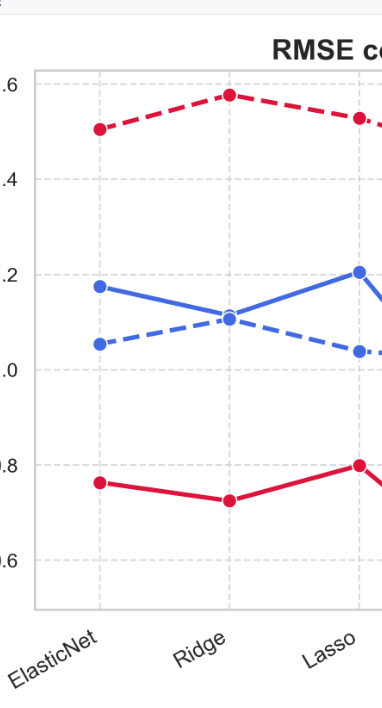 
1. Linear Regression
   - Elastic Net
   - Ridge
   - Lasso
2. Boosting Decision Trees （As compare）
   - GBR
   - LightGBM
   - XGBoostRegressor (the optimization version of GBDT by using L1/L2 regularization.)

**The linear models are underfitting may be the question is.**

In [37]:
# import libraries
import os
import sys
import numpy as np
import pandas as pd
# Set random seed for reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

In [38]:
current_path = os.getcwd()
current_path

'c:\\Users\\Fortyfour\\Desktop\\graduation_design\\Scripts_git\\SingleModels'

In [39]:
# To import the custom module from a specific path
sys.path.insert(0, os.path.join(current_path, '../'))
# Importing the custom module
from Utools.draw import plot_feature_importance, plot_feature_importance
from Utools.SingleModel import SingleModel

In [40]:
from sklearn.base import clone
# Import sklearn models
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import ElasticNet, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline

## Load Data

In [41]:
# Load data
file_dir = os.path.join(current_path, '../Data/composition_data/feature_data')
# dft data
dft_train = pd.read_csv(os.path.join(file_dir, 'dft', 'train.csv'))
dft_test = pd.read_csv(os.path.join(file_dir, 'dft', 'test.csv'))
# exp data
exp_train = pd.read_csv(os.path.join(file_dir, 'exp', 'train.csv'))
exp_test = pd.read_csv(os.path.join(file_dir, 'exp', 'test.csv'))

In [42]:
dft_train_X = dft_train.drop(columns=['composition', 'band_gap'])
dft_train_y = dft_train['band_gap']
exp_train_X = exp_train.drop(columns=['composition', 'band_gap'])
exp_train_y = exp_train['band_gap']
dft_test_X = dft_test.drop(columns=['composition', 'band_gap'])
dft_test_y = dft_test['band_gap']
exp_test_X = exp_test.drop(columns=['composition', 'band_gap'])
exp_test_y = exp_test['band_gap']

In [43]:
# save model performance as df
metrics_df = pd.DataFrame(columns=['Model', 'Train_set', 'Test_set', 'R²', 'RMSE', 'MAE'])

## Model Train

In [44]:
models = {
    # Linear models
    'ElasticNet': ElasticNet(alpha=0.01, l1_ratio=0.05, random_state=RANDOM_SEED),
    'Ridge': Ridge(alpha=0.01, random_state=RANDOM_SEED),
    'Lasso': Lasso(alpha=0.01, random_state=RANDOM_SEED), 
    # GBDT models
    'GBR': GradientBoostingRegressor(n_estimators=500, learning_rate=0.1, max_features='sqrt', random_state=RANDOM_SEED),   
    'LightGBM': LGBMRegressor(objective='regression', n_estimators=500, learning_rate=0.05, 
                              reg_alpha=0.1, reg_lambda=0.1, max_depth=-1, random_state=RANDOM_SEED),
    'XGBoost': XGBRegressor(objective='reg:squarederror',n_estimators=500, learning_rate=0.1, max_depth=4, random_state=RANDOM_SEED)
}

####################################################################################################
[1/6 - DFT - ElasticNet] Training ElasticNet on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total=   6.6s
Model training completed!
[Train] Evaluating DFT ElasticNet on DFT train set:


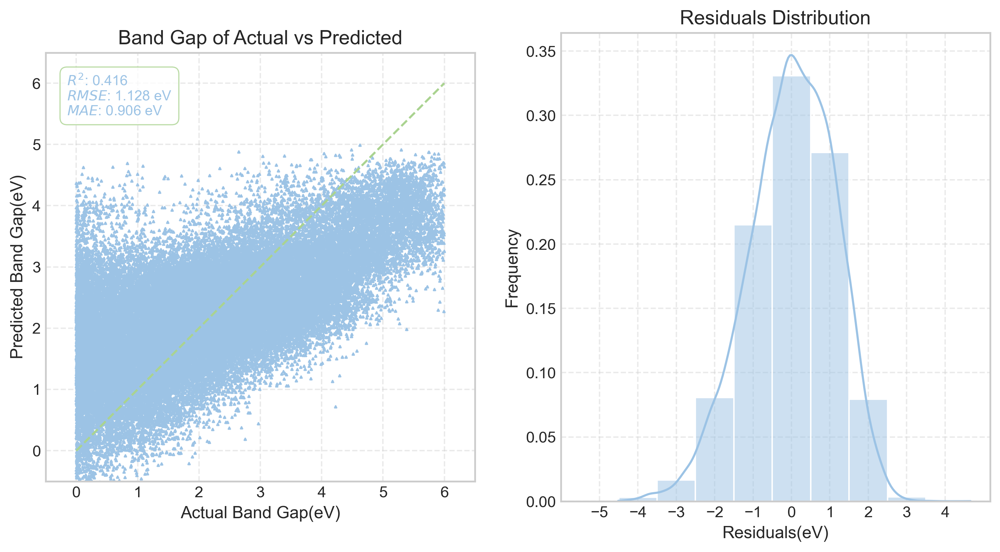


Model Evaluation Results:
Test set: R²: 0.4165 RMSE: 1.1280 MAE: 0.9061
[Test] Evaluating DFT ElasticNet on DFT test set:


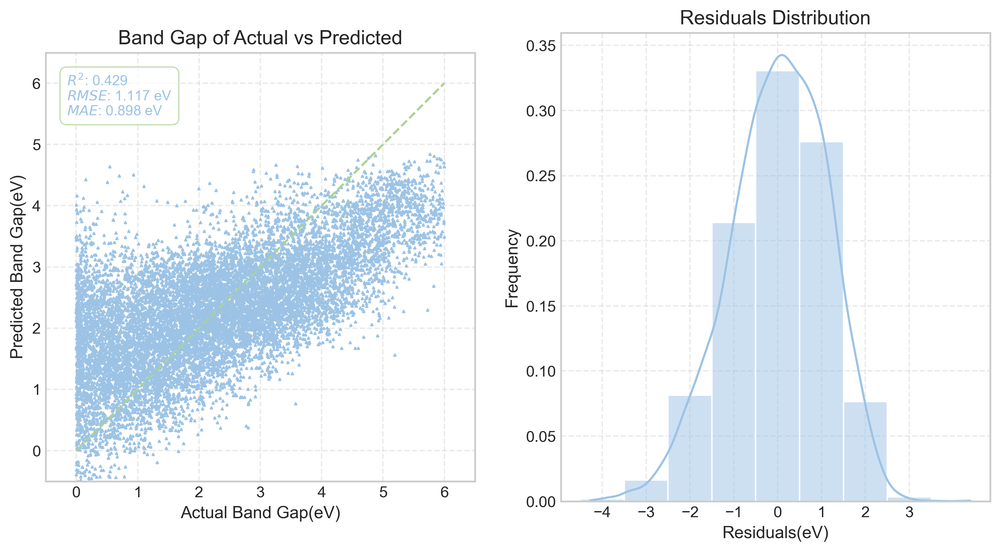


Model Evaluation Results:
Test set: R²: 0.4294 RMSE: 1.1165 MAE: 0.8978
[Test] Evaluating DFT ElasticNet on EXP test set:


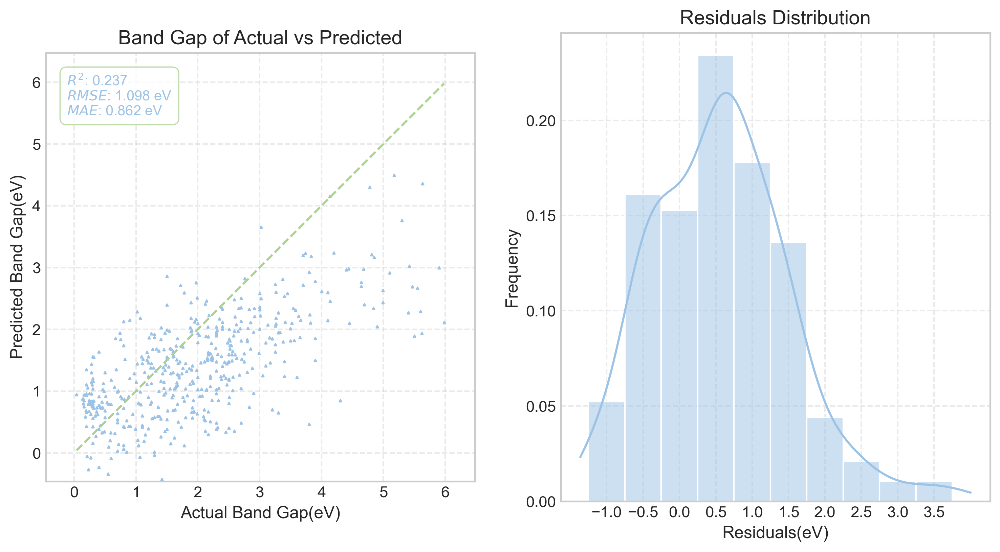


Model Evaluation Results:
Test set: R²: 0.2366 RMSE: 1.0980 MAE: 0.8615
####################################################################################################
[1/6 - EXP - ElasticNet] Training ElasticNet on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.1s
Model training completed!
[Train] Evaluating EXP ElasticNet on EXP train set:


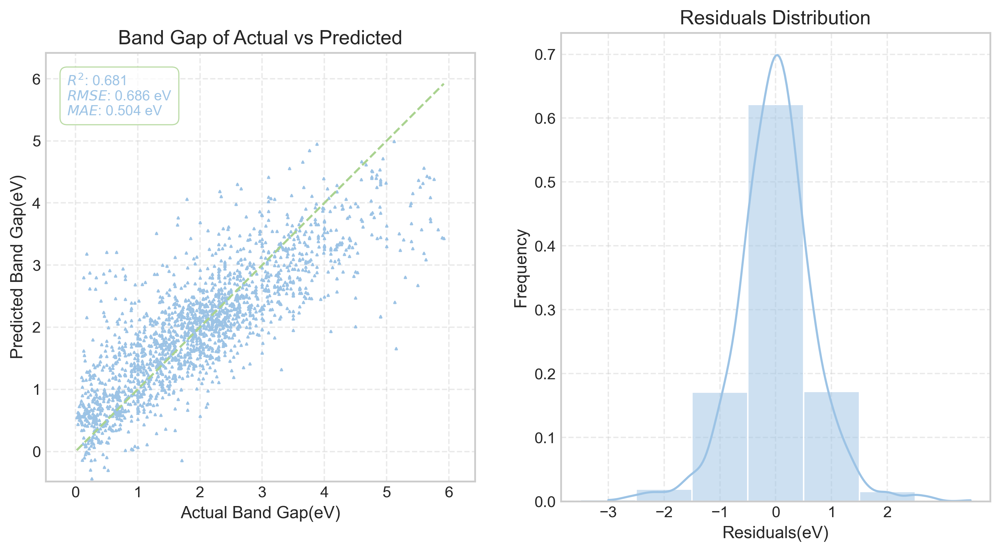


Model Evaluation Results:
Test set: R²: 0.6805 RMSE: 0.6858 MAE: 0.5042
[Test] Evaluating EXP ElasticNet on EXP test set:


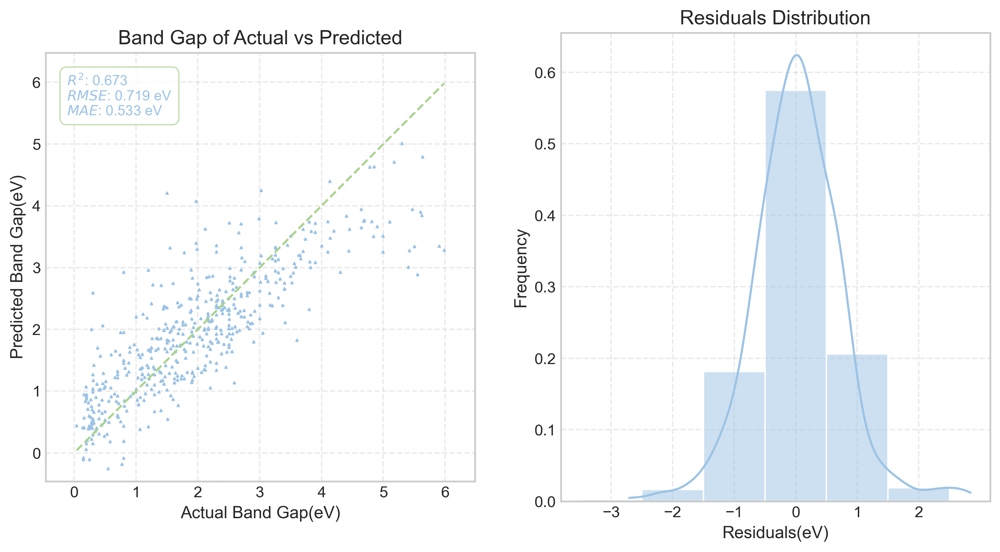


Model Evaluation Results:
Test set: R²: 0.6726 RMSE: 0.7191 MAE: 0.5329
[Test] Evaluating EXP ElasticNet on DFT test set:


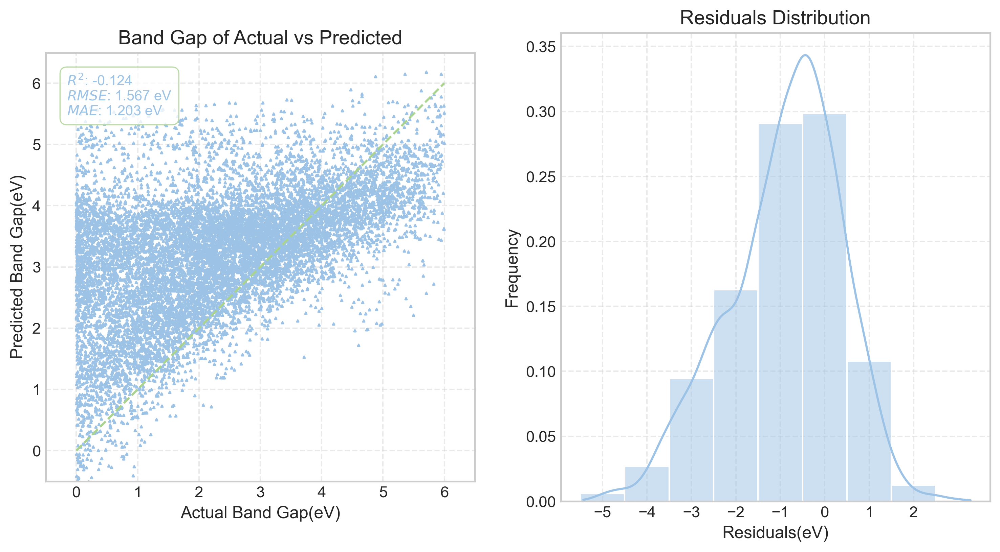


Model Evaluation Results:
Test set: R²: -0.1235 RMSE: 1.5668 MAE: 1.2027
####################################################################################################
[2/6 - DFT - Ridge] Training Ridge on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.1s
Model training completed!
[Train] Evaluating DFT Ridge on DFT train set:


C:\Users\Fortyfour\AppData\Local\Temp\ipykernel_11404\3084793693.py:90: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)


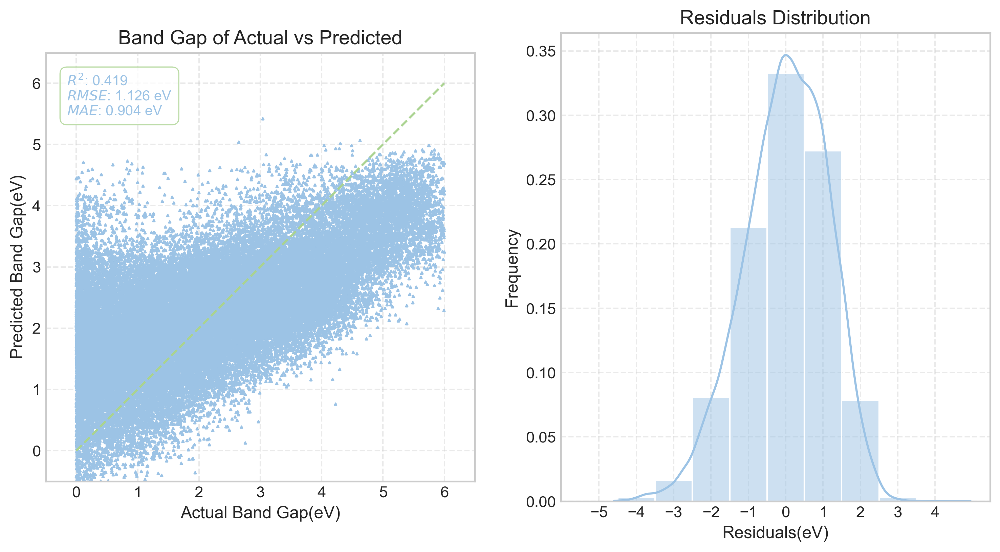


Model Evaluation Results:
Test set: R²: 0.4185 RMSE: 1.1260 MAE: 0.9036
[Test] Evaluating DFT Ridge on DFT test set:


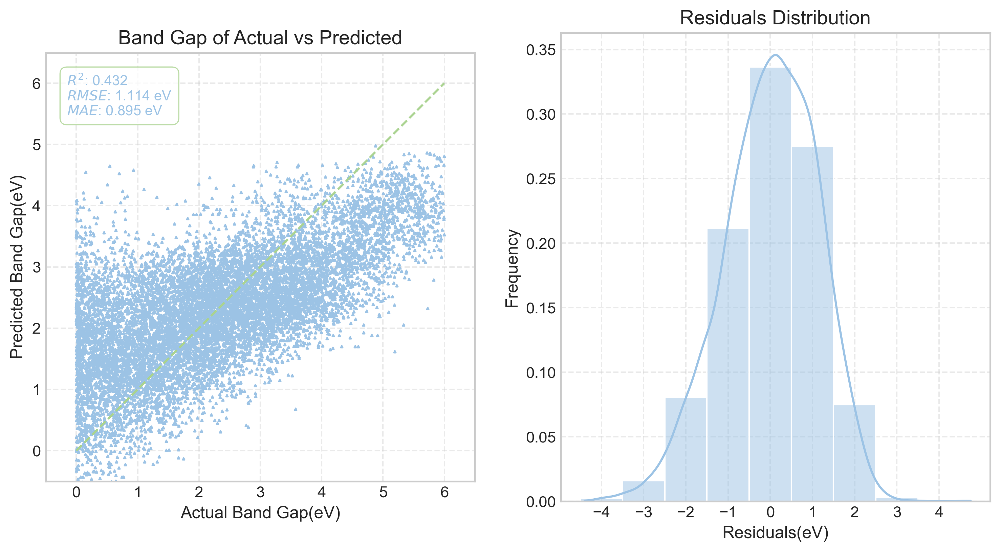


Model Evaluation Results:
Test set: R²: 0.4318 RMSE: 1.1142 MAE: 0.8947
[Test] Evaluating DFT Ridge on EXP test set:


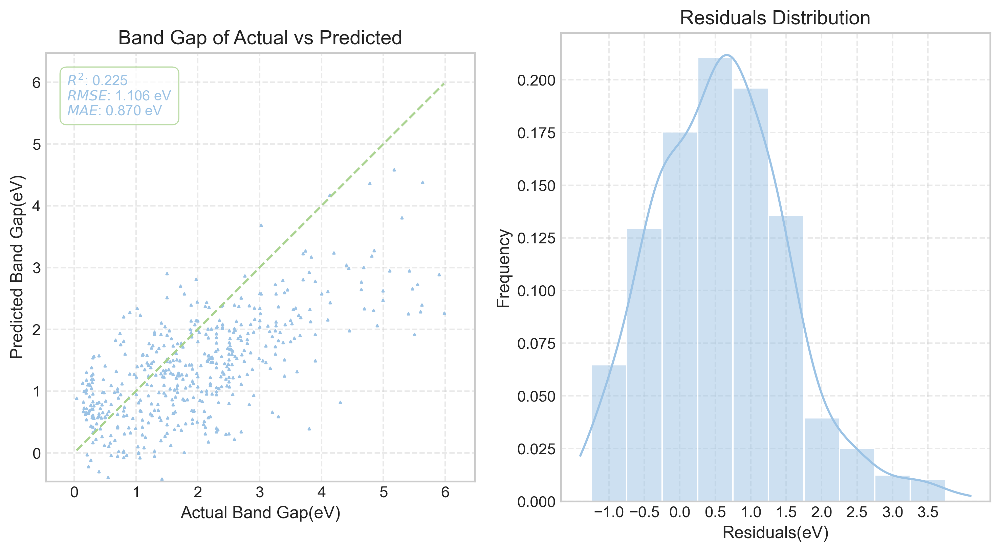


Model Evaluation Results:
Test set: R²: 0.2248 RMSE: 1.1064 MAE: 0.8698
####################################################################################################
[2/6 - EXP - Ridge] Training Ridge on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.0s
Model training completed!
[Train] Evaluating EXP Ridge on EXP train set:


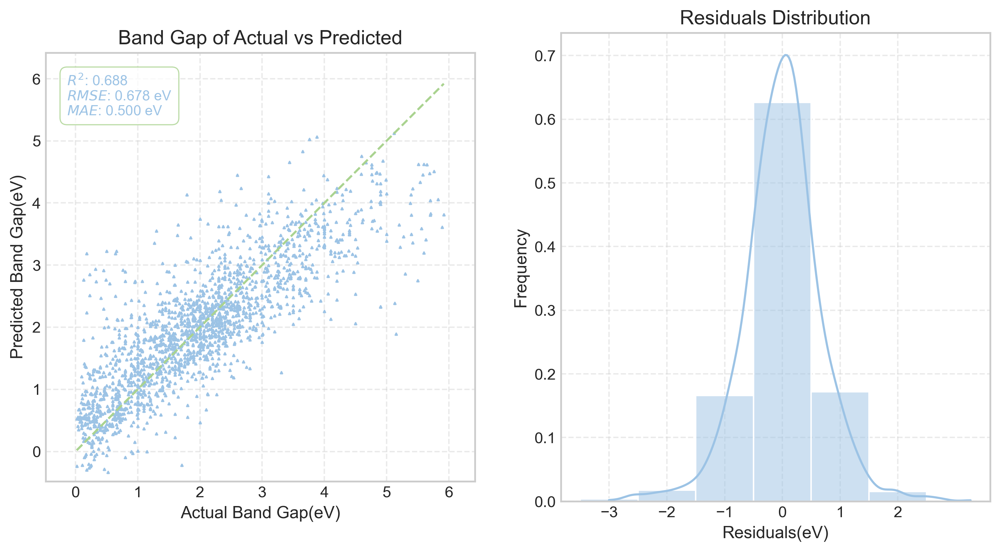


Model Evaluation Results:
Test set: R²: 0.6878 RMSE: 0.6780 MAE: 0.4998
[Test] Evaluating EXP Ridge on EXP test set:


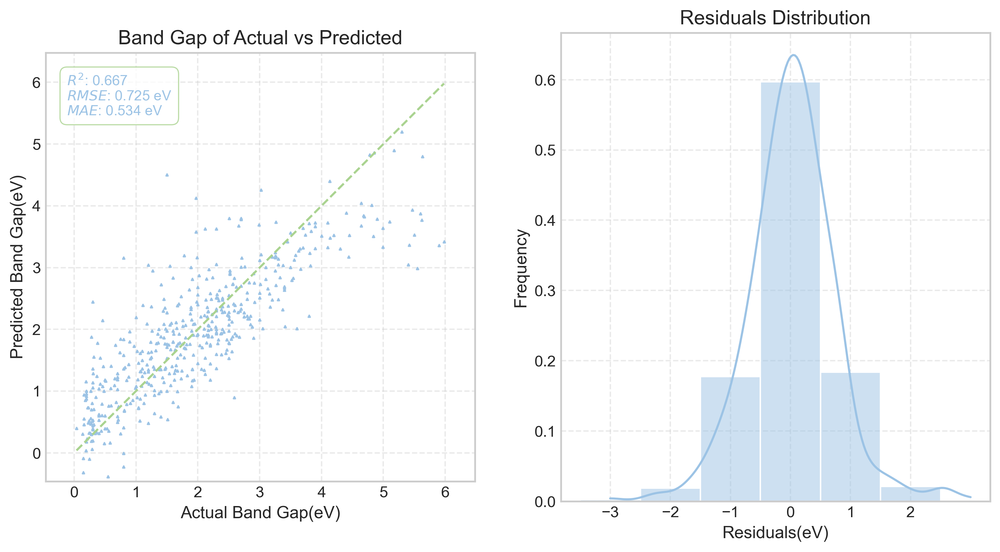


Model Evaluation Results:
Test set: R²: 0.6674 RMSE: 0.7248 MAE: 0.5339
[Test] Evaluating EXP Ridge on DFT test set:


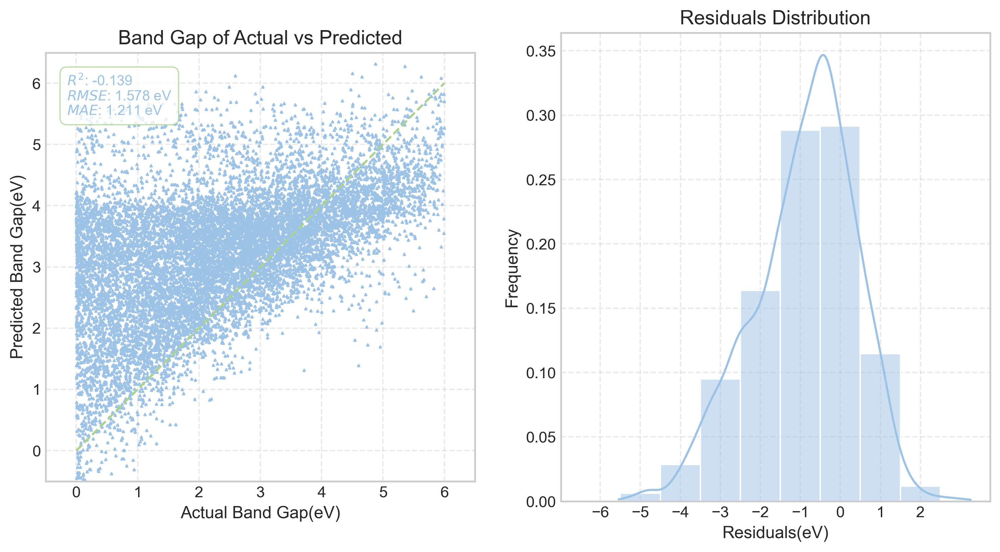


Model Evaluation Results:
Test set: R²: -0.1393 RMSE: 1.5777 MAE: 1.2109
####################################################################################################
[3/6 - DFT - Lasso] Training Lasso on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.2s
[Pipeline] ............. (step 2 of 2) Processing model, total=   3.1s
Model training completed!
[Train] Evaluating DFT Lasso on DFT train set:


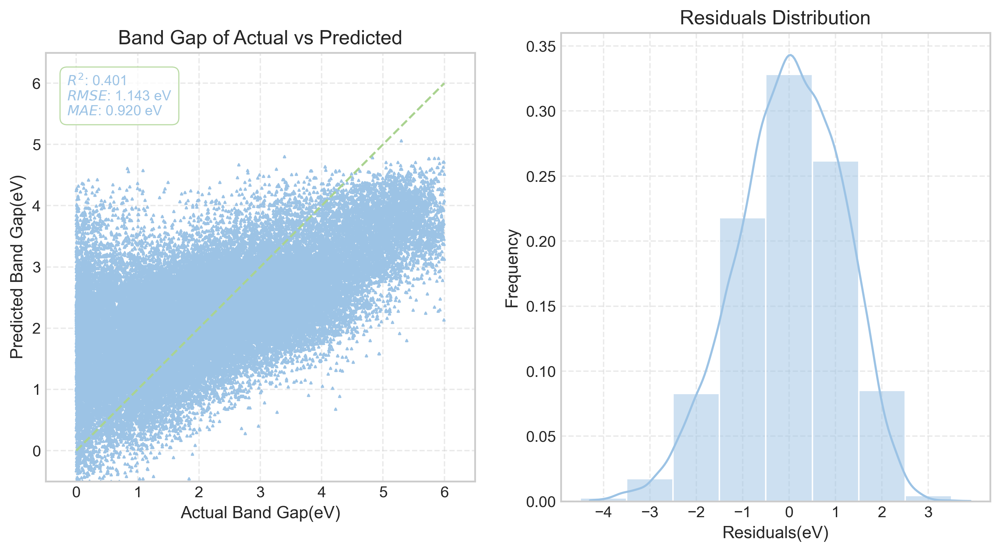


Model Evaluation Results:
Test set: R²: 0.4005 RMSE: 1.1433 MAE: 0.9198
[Test] Evaluating DFT Lasso on DFT test set:


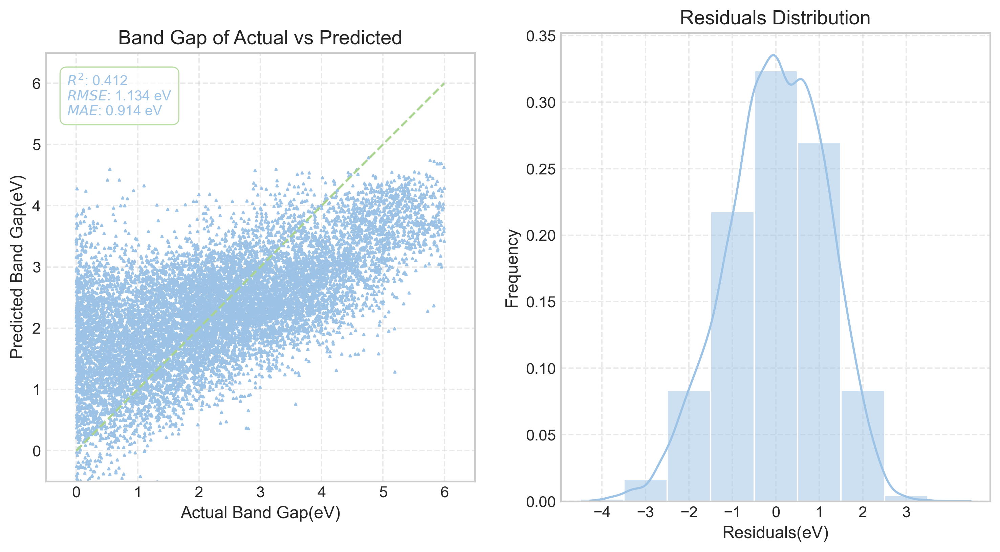


Model Evaluation Results:
Test set: R²: 0.4117 RMSE: 1.1337 MAE: 0.9141
[Test] Evaluating DFT Lasso on EXP test set:


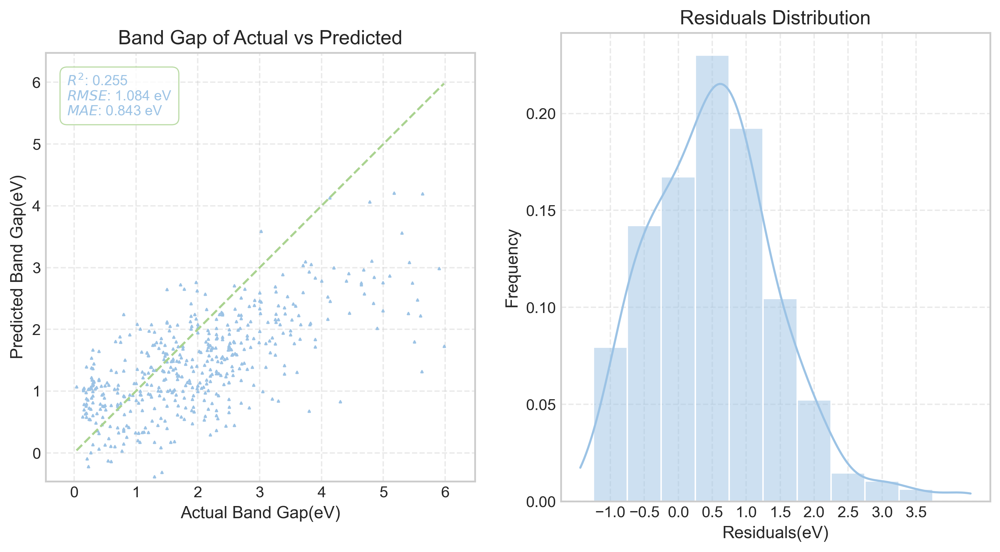


Model Evaluation Results:
Test set: R²: 0.2555 RMSE: 1.0843 MAE: 0.8431
####################################################################################################
[3/6 - EXP - Lasso] Training Lasso on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.0s
Model training completed!
[Train] Evaluating EXP Lasso on EXP train set:


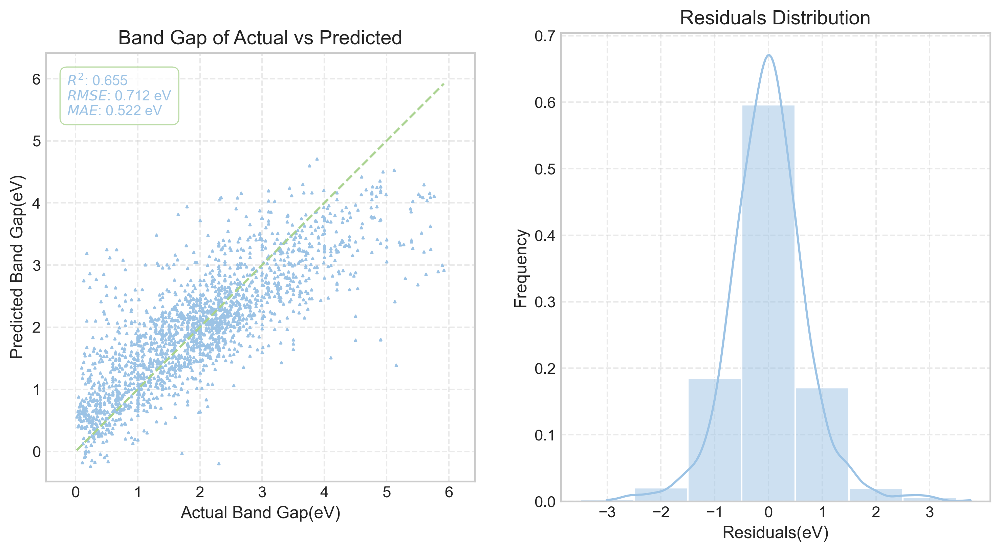


Model Evaluation Results:
Test set: R²: 0.6553 RMSE: 0.7124 MAE: 0.5224
[Test] Evaluating EXP Lasso on EXP test set:


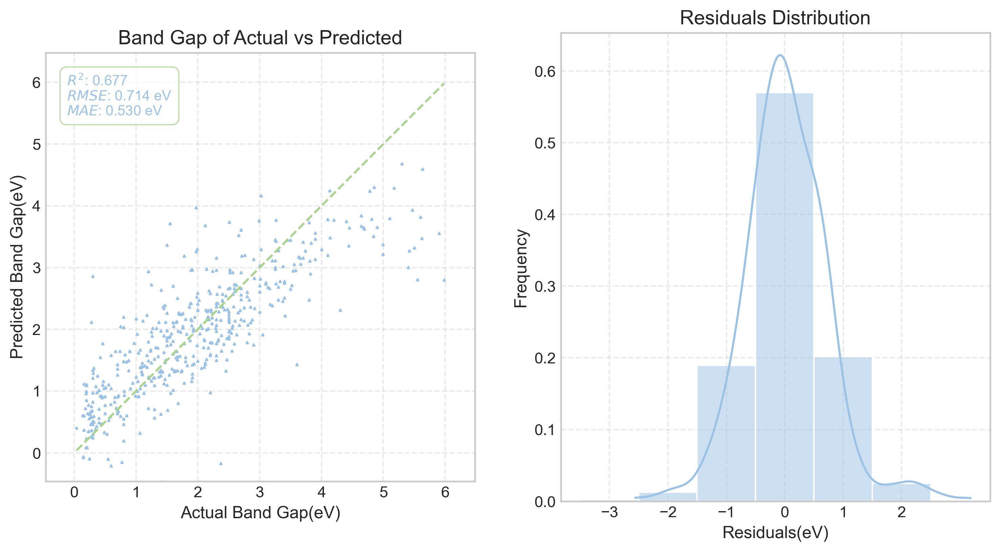


Model Evaluation Results:
Test set: R²: 0.6773 RMSE: 0.7139 MAE: 0.5303
[Test] Evaluating EXP Lasso on DFT test set:


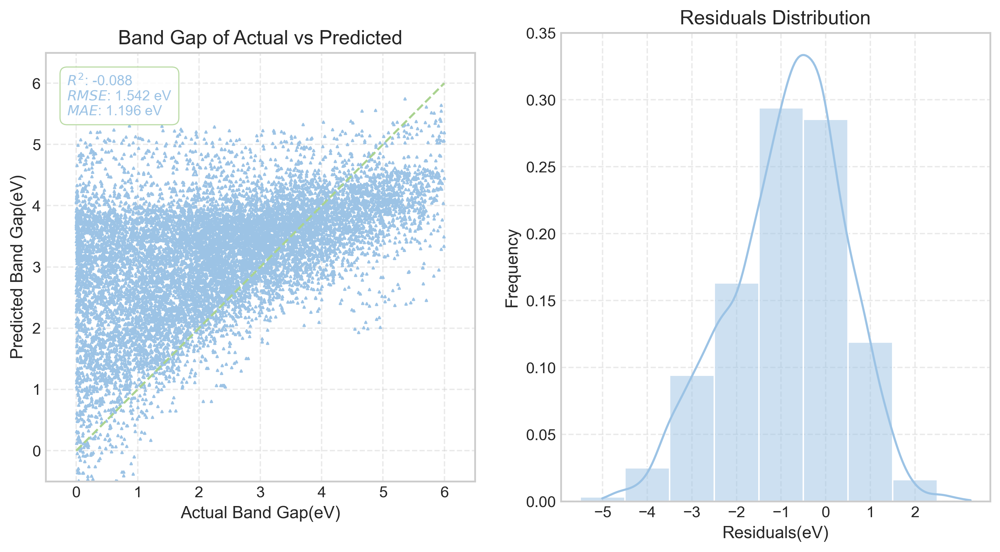


Model Evaluation Results:
Test set: R²: -0.0885 RMSE: 1.5421 MAE: 1.1960
####################################################################################################
[4/6 - DFT - GBR] Training GBR on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total=  20.6s
Model training completed!
[Train] Evaluating DFT GBR on DFT train set:


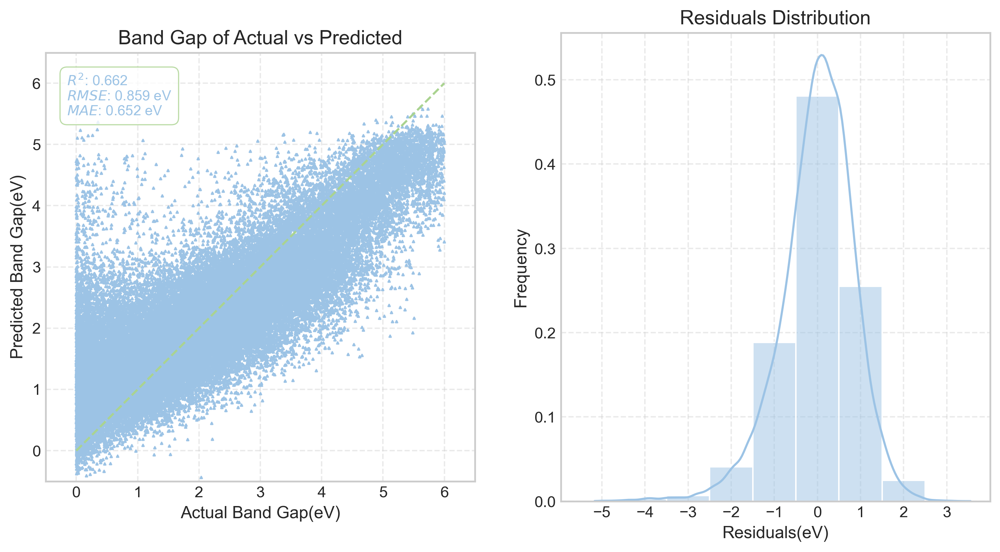


Model Evaluation Results:
Test set: R²: 0.6615 RMSE: 0.8591 MAE: 0.6523
[Test] Evaluating DFT GBR on DFT test set:


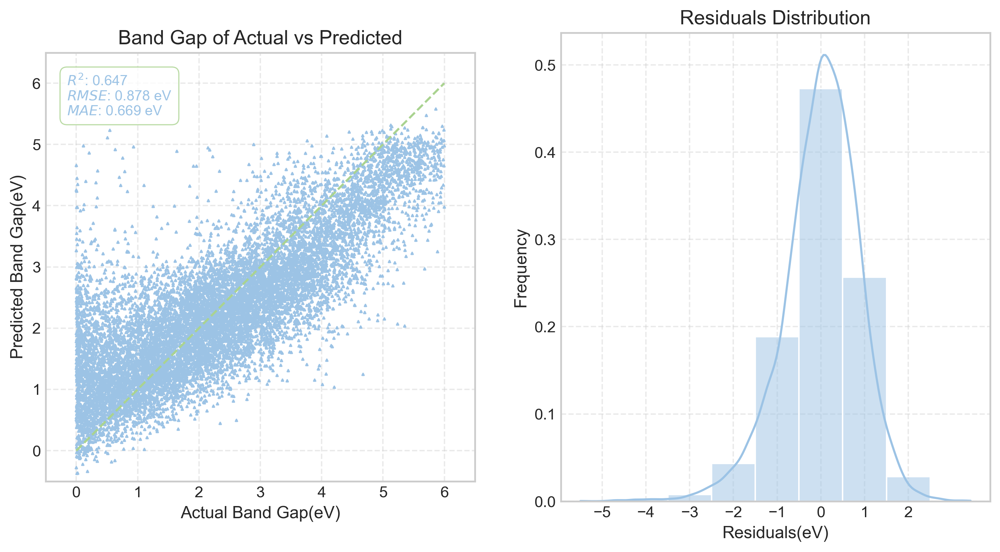


Model Evaluation Results:
Test set: R²: 0.6475 RMSE: 0.8776 MAE: 0.6692
[Test] Evaluating DFT GBR on EXP test set:


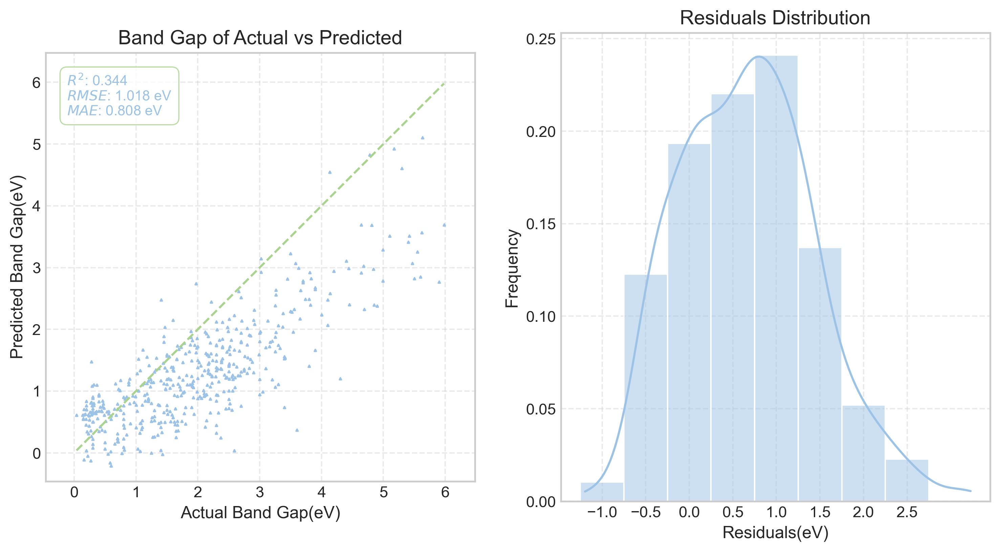


Model Evaluation Results:
Test set: R²: 0.3437 RMSE: 1.0181 MAE: 0.8084
####################################################################################################
[4/6 - EXP - GBR] Training GBR on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   1.2s
Model training completed!
[Train] Evaluating EXP GBR on EXP train set:


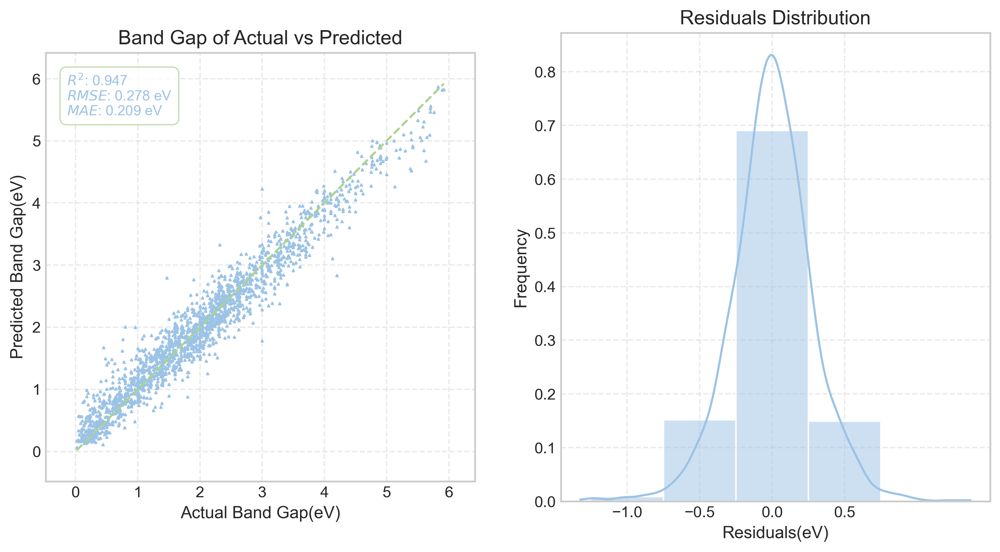


Model Evaluation Results:
Test set: R²: 0.9473 RMSE: 0.2785 MAE: 0.2086
[Test] Evaluating EXP GBR on EXP test set:


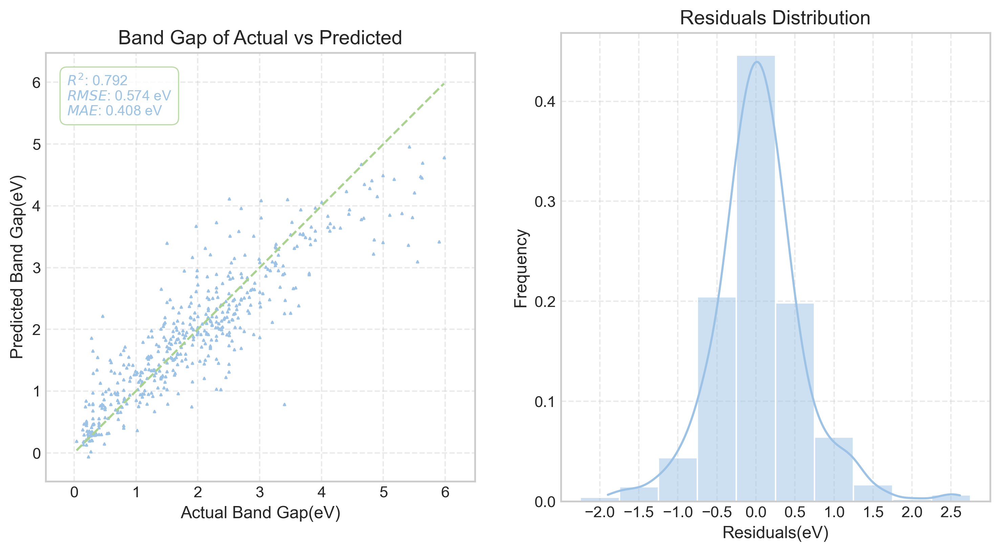


Model Evaluation Results:
Test set: R²: 0.7916 RMSE: 0.5737 MAE: 0.4085
[Test] Evaluating EXP GBR on DFT test set:


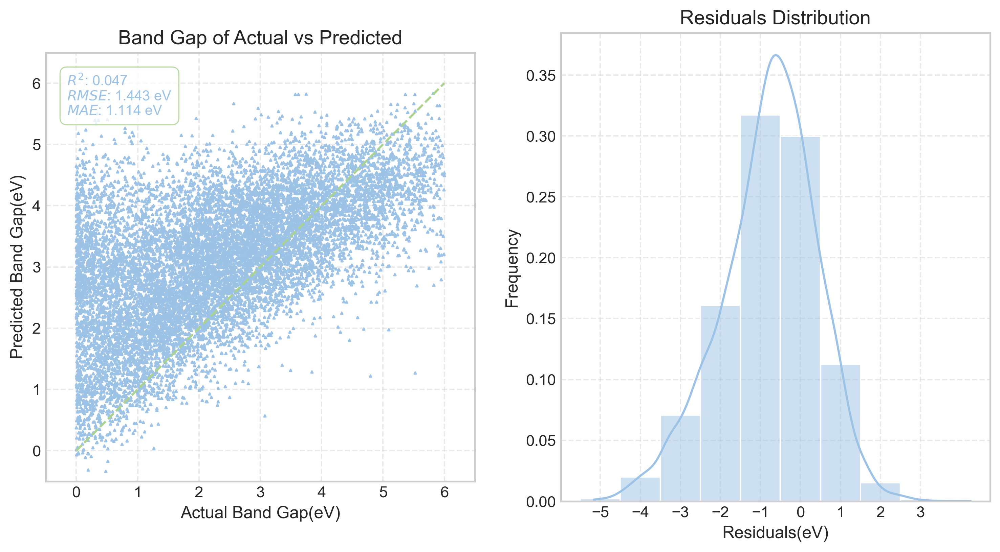


Model Evaluation Results:
Test set: R²: 0.0470 RMSE: 1.4430 MAE: 1.1143
####################################################################################################
[5/6 - DFT - LightGBM] Training LightGBM on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.2s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11635
[LightGBM] [Info] Number of data points in the train set: 46514, number of used features: 102
[LightGBM] [Info] Start training from score 2.286416
[Pipeline] ............. (step 2 of 2) Processing model, total=   5.8s
Model training completed!
[Train] Evaluating DFT LightGBM on DFT train set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


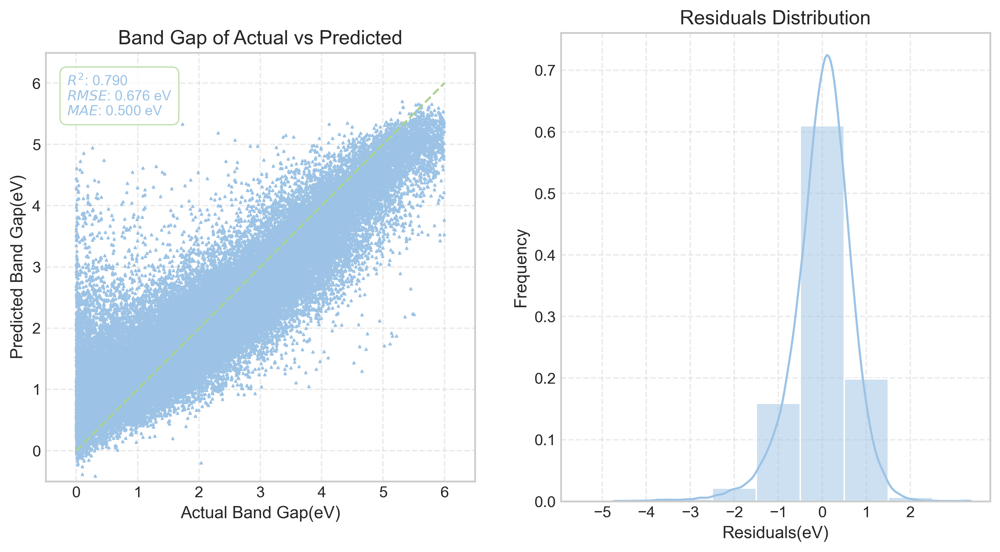


Model Evaluation Results:
Test set: R²: 0.7903 RMSE: 0.6762 MAE: 0.5004
[Test] Evaluating DFT LightGBM on DFT test set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


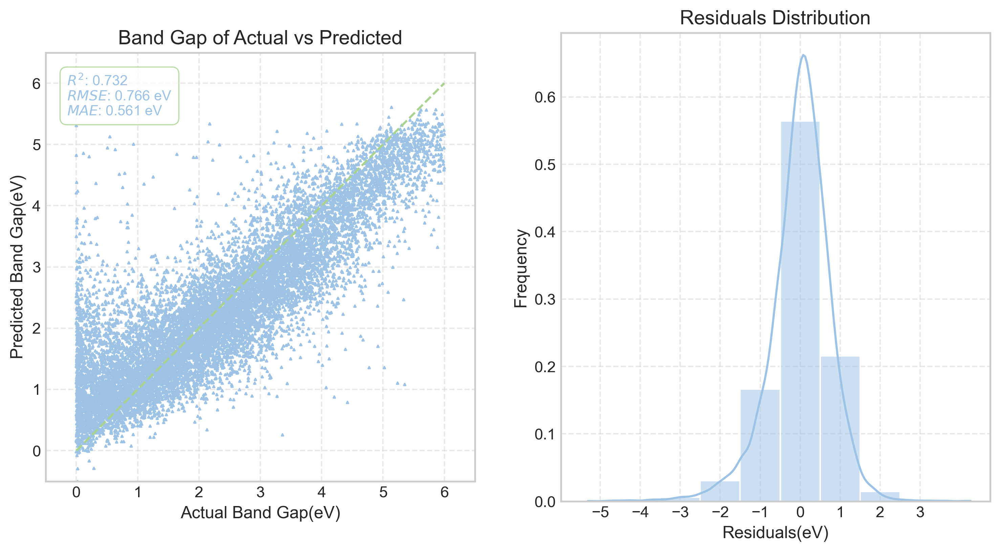


Model Evaluation Results:
Test set: R²: 0.7316 RMSE: 0.7657 MAE: 0.5612
[Test] Evaluating DFT LightGBM on EXP test set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


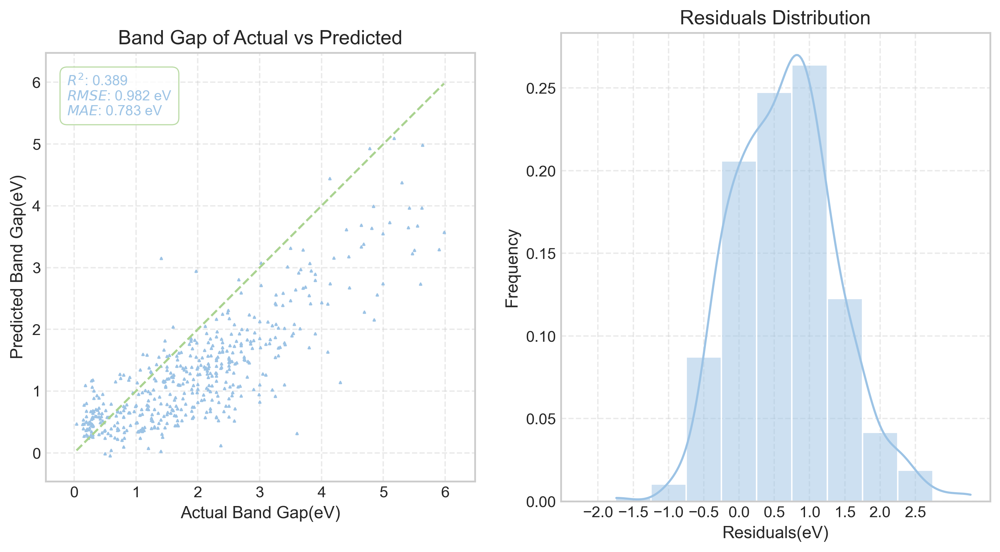


Model Evaluation Results:
Test set: R²: 0.3895 RMSE: 0.9819 MAE: 0.7832
####################################################################################################
[5/6 - EXP - LightGBM] Training LightGBM on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10131
[LightGBM] [Info] Number of data points in the train set: 1933, number of used features: 97
[LightGBM] [Info] Start training from score 1.968339
[Pipeline] ............. (step 2 of 2) Processing model, total=   1.1s
Model training completed!
[Train] Evaluating EXP LightGBM on EXP train set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


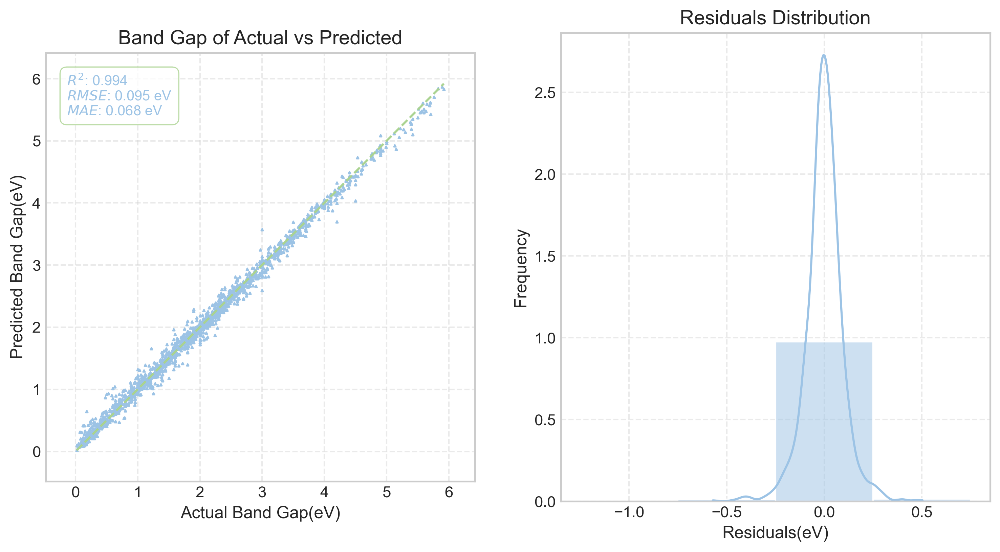


Model Evaluation Results:
Test set: R²: 0.9938 RMSE: 0.0955 MAE: 0.0677
[Test] Evaluating EXP LightGBM on EXP test set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


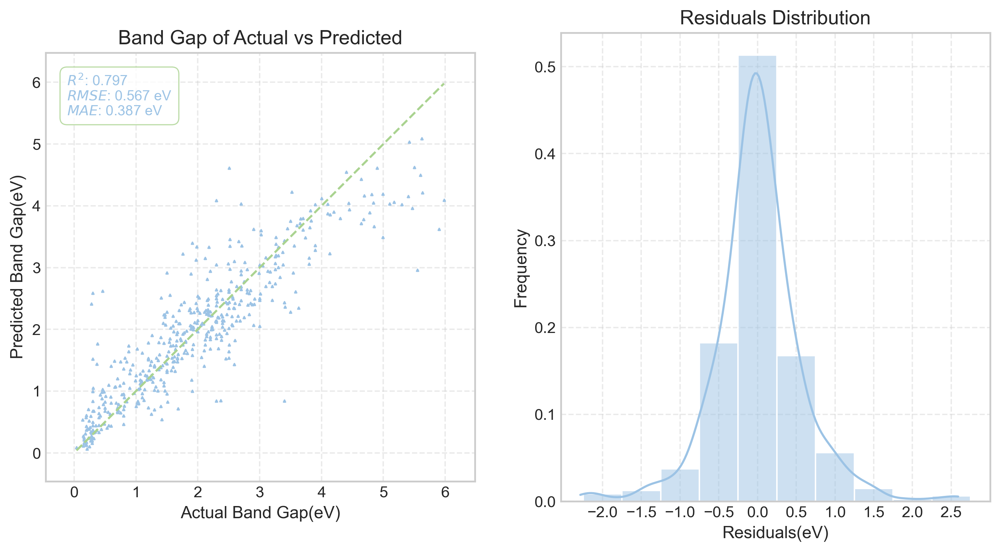


Model Evaluation Results:
Test set: R²: 0.7967 RMSE: 0.5666 MAE: 0.3871
[Test] Evaluating EXP LightGBM on DFT test set:


e:\software2\Anaconda\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


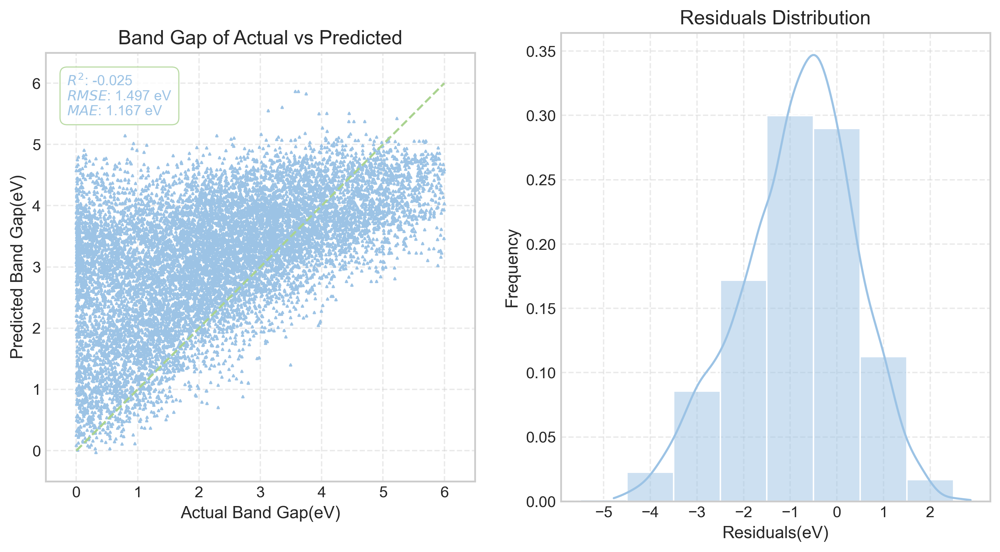


Model Evaluation Results:
Test set: R²: -0.0250 RMSE: 1.4965 MAE: 1.1669
####################################################################################################
[6/6 - DFT - XGBoost] Training XGBoost on DFT data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.2s
[Pipeline] ............. (step 2 of 2) Processing model, total=   2.8s
Model training completed!
[Train] Evaluating DFT XGBoost on DFT train set:


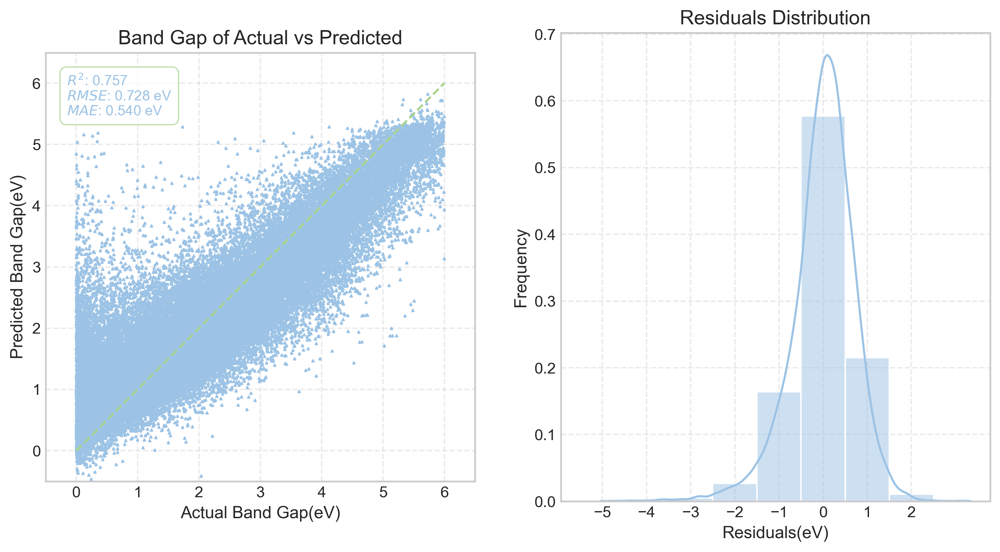


Model Evaluation Results:
Test set: R²: 0.7570 RMSE: 0.7278 MAE: 0.5403
[Test] Evaluating DFT XGBoost on DFT test set:


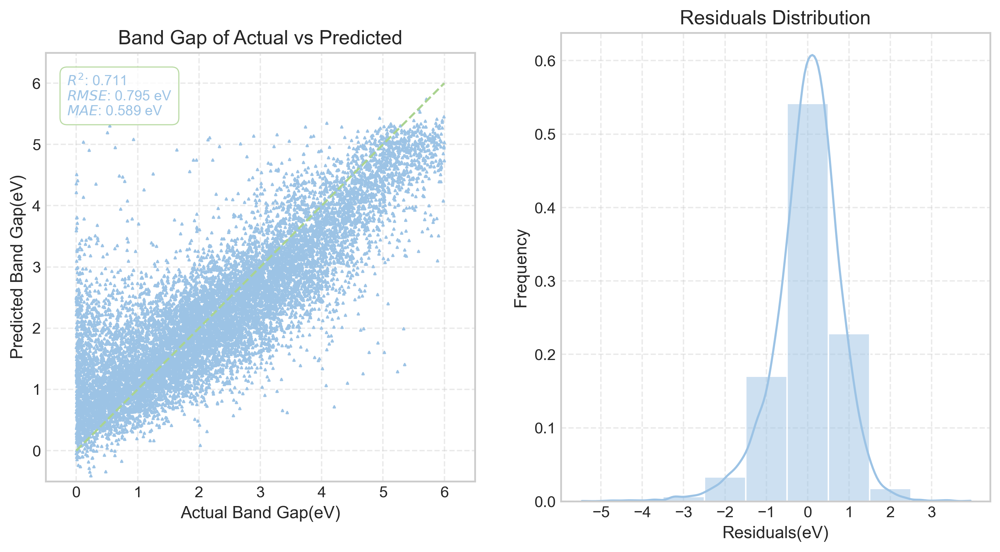


Model Evaluation Results:
Test set: R²: 0.7111 RMSE: 0.7945 MAE: 0.5888
[Test] Evaluating DFT XGBoost on EXP test set:


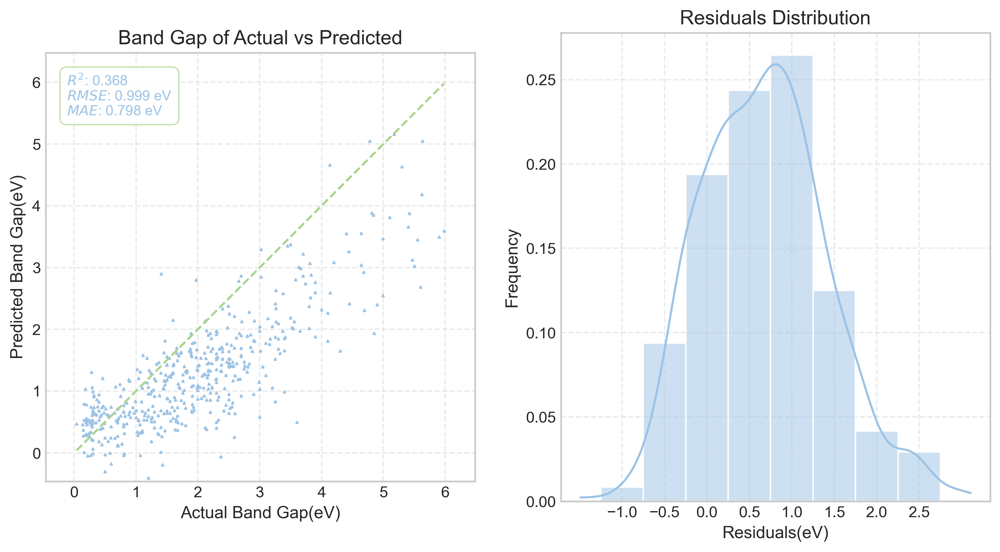


Model Evaluation Results:
Test set: R²: 0.3676 RMSE: 0.9993 MAE: 0.7976
####################################################################################################
[6/6 - EXP - XGBoost] Training XGBoost on EXP data:
----------------------------------------------------------------------------------------------------
Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.8s
Model training completed!
[Train] Evaluating EXP XGBoost on EXP train set:


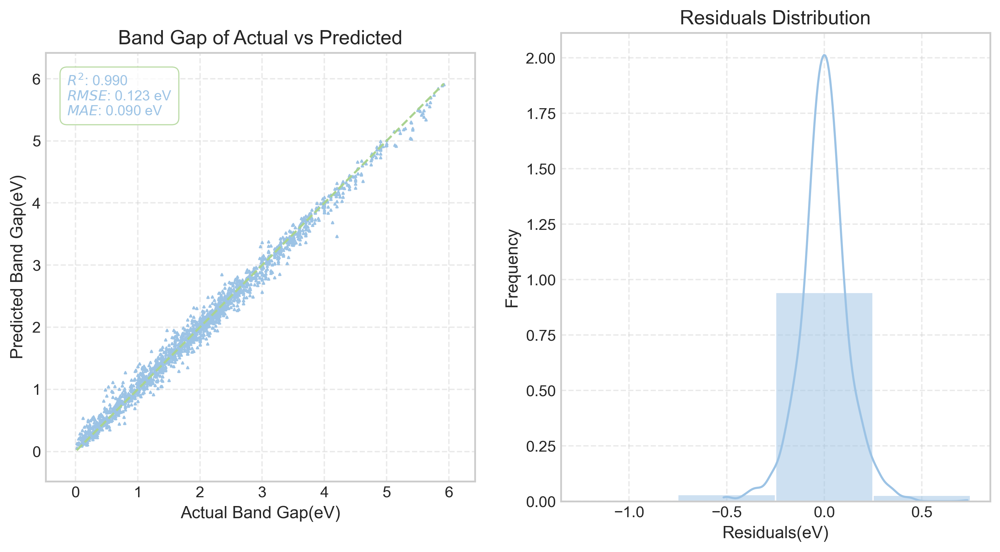


Model Evaluation Results:
Test set: R²: 0.9898 RMSE: 0.1225 MAE: 0.0896
[Test] Evaluating EXP XGBoost on EXP test set:


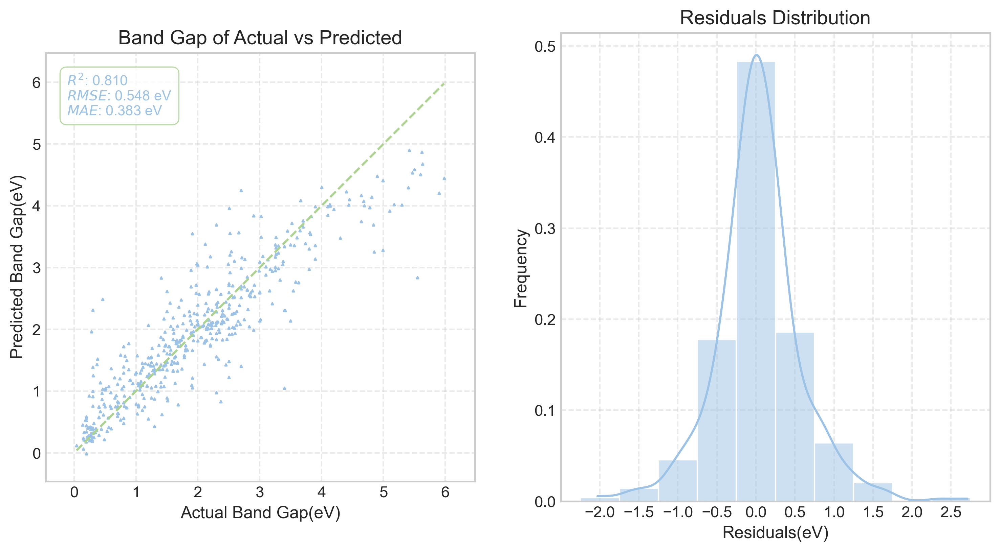


Model Evaluation Results:
Test set: R²: 0.8101 RMSE: 0.5476 MAE: 0.3830
[Test] Evaluating EXP XGBoost on DFT test set:


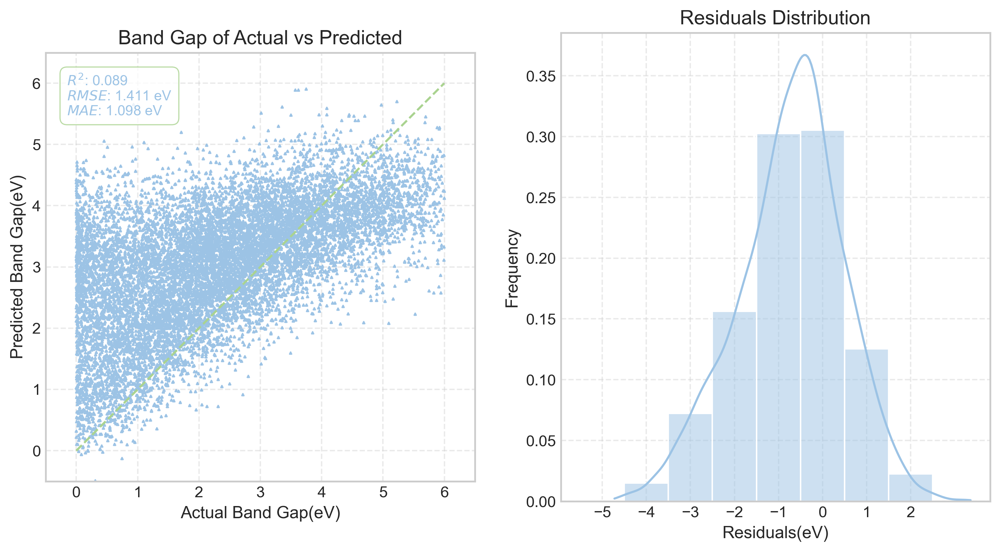


Model Evaluation Results:
Test set: R²: 0.0886 RMSE: 1.4111 MAE: 1.0981


In [45]:
model_number = 0
model_nums = len(models)
# Loop through each model
for model_name, model in models.items():
    model_number += 1
    # Create directories for saving models and figures
    file_path = os.path.join(current_path, model_name)
    fig_path = os.path.join(file_path, 'figures')
    model_path = os.path.join(file_path, 'model')
    # Create directories if they don't exist
    os.makedirs(file_path, exist_ok=True)
    os.makedirs(fig_path, exist_ok=True)
    os.makedirs(model_path, exist_ok=True)

    # record model metrics
    model_metrics = pd.DataFrame(columns=['Model', 'Train_set', 'Test_set', 'R²', 'RMSE', 'MAE'])
    # Train the model on dft data
    print("#" * 100)
    print(f"[{model_number}/{model_nums} - DFT - {model_name}] Training {model_name} on DFT data:")
    print("-" * 100)
    
    dft_model = SingleModel(clone(model), random_state=RANDOM_SEED)
    dft_model.train(dft_train_X, dft_train_y)
    
    # evaluate on the dft train set
    print(f"[Train] Evaluating DFT {model_name} on DFT train set:")
    dft_model.evaluate(dft_train_X, dft_train_y, fig_path=None)

    # evaluate on the dft test set
    print(f"[Test] Evaluating DFT {model_name} on DFT test set:")
    
    metrics = dft_model.evaluate(dft_test_X, dft_test_y, fig_path=None)
    model_metrics.loc[len(model_metrics)] = {
    'Model': model_name,
    'Train_set': 'dft',
    'Test_set': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
    # evaluate on the exp test set
    print(f"[Test] Evaluating DFT {model_name} on EXP test set:")
    metrics = dft_model.evaluate(exp_test_X, exp_test_y, fig_path=None)
    model_metrics.loc[len(model_metrics)] = {
    'Model': model_name,
    'Train_set': 'dft',
    'Test_set': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
    ################################################
    # Train the model on exp data
    print("#" * 100)
    print(f"[{model_number}/{model_nums} - EXP - {model_name}] Training {model_name} on EXP data:")
    print("-" * 100)

    exp_model = SingleModel(clone(model), random_state=RANDOM_SEED)
    exp_model.train(exp_train_X, exp_train_y)

    # evaluate on the exp train set
    print(f"[Train] Evaluating EXP {model_name} on EXP train set:")
    exp_model.evaluate(exp_train_X, exp_train_y, fig_path=None)

    # evaluate on the exp test set
    print(f"[Test] Evaluating EXP {model_name} on EXP test set:")
    metrics = exp_model.evaluate(exp_test_X, exp_test_y, fig_path=None)
    model_metrics.loc[len(model_metrics)] = {
    'Model': model_name,
    'Train_set': 'exp',
    'Test_set': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
    # evaluate on the dft test set
    print(f"[Test] Evaluating EXP {model_name} on DFT test set:")
    metrics = exp_model.evaluate(dft_test_X, dft_test_y, fig_path=None)
    model_metrics.loc[len(model_metrics)] = {
    'Model': model_name,
    'Train_set': 'exp',
    'Test_set': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
    # save model metrics
    # model_metrics.to_csv(os.path.join(file_path, f'{model_name}_metrics.csv'), index=False)
    # append model metrics to the main metrics dataframe
    metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)
    #################################################
    # Feature importance plot
    # For models that support feature importance
    # if model_name in ['LightGBM', 'XGBoost', 'RandomForest', 'ExtraRandomTrees']:
    #     # 
    #     print(f"Plotting feature importance for {model_name} on DFT data:")
    #     dft_importances_df = plot_feature_importance(dft_model.get_model(), dft_train_X.columns, top_n=10,
    #                         fig_path=os.path.join(fig_path, f'dft_feature_importance.png'))
    #     print(f"Plotting feature importance for {model_name} on EXP data:")
    #     exp_importances_df = plot_feature_importance(exp_model.get_model(), exp_train_X.columns, top_n=10,
    #                         fig_path=os.path.join(fig_path, f'exp_feature_importance.png'))  
# save metrics to csv
# metrics_df.to_csv(os.path.join(current_path, 'metrics.csv'), index=False)

## Analysis

In [46]:
metrics_df

,Model,Train_set,Test_set,R²,RMSE,MAE
0,ElasticNet,dft,dft,0.429443,1.116509,0.897839
1,ElasticNet,dft,exp,0.236563,1.098023,0.861543
2,ElasticNet,exp,exp,0.672597,0.719062,0.532891
3,ElasticNet,exp,dft,-0.123515,1.566758,1.202668
4,Ridge,dft,dft,0.431791,1.114209,0.894721
5,Ridge,dft,exp,0.224808,1.106445,0.869810
6,Ridge,exp,exp,0.667393,0.724754,0.533855
7,Ridge,exp,dft,-0.139271,1.577706,1.210940
8,Lasso,dft,dft,0.411698,1.133738,0.914137
9,Lasso,dft,exp,0.255487,1.084329,0.843085


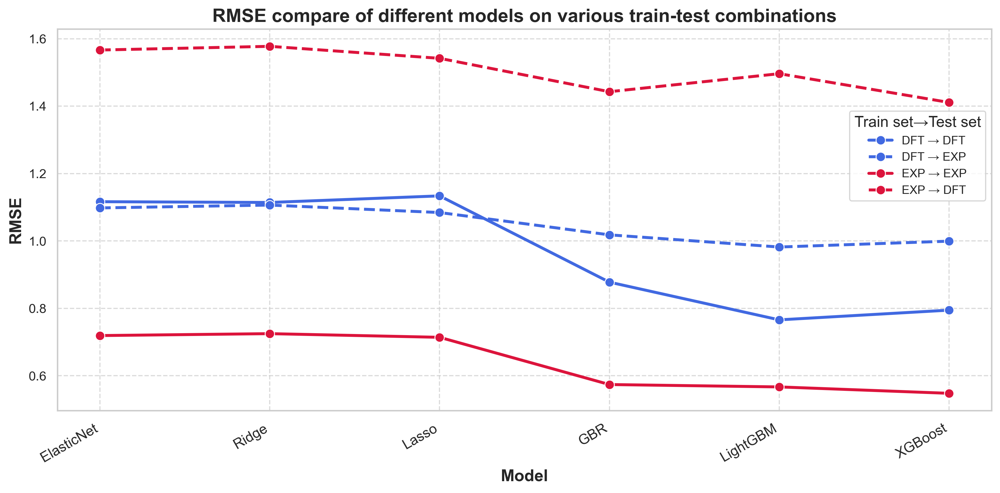

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# set style
sns.set_theme(style="whitegrid")
plt.figure(figsize=(12, 6), dpi=300)

# get unique models
models = metrics_df['Model'].unique()

# prepare data for plotting
plot_data = []
for model in models:
    model_metrics = metrics_df[metrics_df['Model'] == model]
    for _, row in model_metrics.iterrows():
        plot_data.append({
            'Model': row['Model'],
            'Training': row['Train_set'],
            'Testing': row['Test_set'],
            'RMSE': row['RMSE']
        })

plot_df = pd.DataFrame(plot_data)

# set line styles for different training-testing combinations
# same dataset training and testing: solid line
# different dataset training and testing: dashed line
# dft training: blue; exp training: red
line_styles = {
    ('dft', 'dft'): {'color': 'royalblue', 'linestyle': '-', 'label': 'DFT → DFT'},
    ('dft', 'exp'): {'color': 'royalblue', 'linestyle': '--', 'label': 'DFT → EXP'},
    ('exp', 'exp'): {'color': 'crimson', 'linestyle': '-', 'label': 'EXP → EXP'},
    ('exp', 'dft'): {'color': 'crimson', 'linestyle': '--', 'label': 'EXP → DFT'}
}

# plot lines for each model
for (train_set, test_set), style in line_styles.items():
    data = plot_df[(plot_df['Training'] == train_set) & (plot_df['Testing'] == test_set)]
    if not data.empty:
        sns.lineplot(
            data=data,
            x='Model',
            y='RMSE',
            marker='o',
            markersize=8,
            linewidth=2.5,
            **style
        )

# beautify the plot
plt.title('RMSE compare of different models on various train-test combinations', fontsize=16, weight='bold')
plt.xlabel('Model', fontsize=14, weight='bold')
plt.ylabel('RMSE', fontsize=14, weight='bold')
plt.xticks(rotation=30, ha='right', fontsize=12)
# set the legend on the right top corner
plt.legend(title='Train set→Test set', loc='upper right', bbox_to_anchor=(1, 0.8), fontsize=10, title_fontsize=13)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()  # adjust layout to fit all elements

# add figure text
# plt.figtext(0.5, 0.01, 
#            'Solid: train and test on the same type set | Dashes: train and test on the different type set\n'
#            'Blue: train on DFT set | Red: train on EXP set\n', 
#            ha='center', fontsize=11)

# save the figure
# plt.savefig(os.path.join(current_path, 'RMSE_comparison.png'), dpi=300, bbox_inches='tight')
plt.show()